In [1]:
import sys,warnings
sys.path.append('./DevEndo/') # change to the path where devendo.py stript located.
import devendo as de
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import anndata, re,os
import scanpy.external as sce
from scipy.sparse import csr_matrix,csc_matrix, find
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
sc.settings.set_figure_params(dpi=100, facecolor='white')
pd.set_option("display.max_rows", 40)
pd.set_option("display.precision", 2)

## 1. Load data

In [5]:
# STED-EC dataset
adata = sc.read_h5ad('DATA/sted-ec.h5ad')
adata = adata[adata.obs['label']!='EndoMT']

In [109]:
markers = de.split(top_degs['names'], top_degs['state'])

In [112]:
layouts_all = pd.read_csv('data/Organ_cell_umap_layout.csv',index_col = 0)

In [118]:
organ_data = {}
layouts = []
for organ in adata.obs['label'].cat.categories[1:]:
    print(organ)
    sub_adata = adata[adata.obs['label'] == organ]
    organ_data[organ] = de.oneStepUmap(sub_adata)
    lo = pd.DataFrame(organ_data[organ].obsm['X_umap'], index = organ_data[organ].obs_names.tolist())
    lo['organ'] = organ
    layouts.append(lo)

Neurovascular ECs
Pulmonary ECs
Lymphatic ECs
Endocardium
Hepatic ECs
Gastrointestinal ECs
Renal ECs
Muscular&dermal ECs
Arterial ECs


In [61]:
layouts_all = pd.concat(layouts)

## 2. Calculate DEGs

In [ ]:
blacklist = list(de.findBlackList(adata.var_names))+['Alb','Afp']

In [ ]:
adata = adata[:,~adata.var_names.isin(blacklist)]

In [ ]:
deg = de.FindAllMarkers(adata, groupby = 'label',logfc_threshold=0, n_genes=600,min_diff_pct=0.2, sort_values = 'logfoldchanges')

In [ ]:
filtered_deg = deg[~(deg['names'].str.startswith('AC') | deg['names'].str.endswith('Rik'))]
filtered_deg = filtered_deg.groupby('group').head(40)
filtered_deg = filtered_deg.groupby('names').head(1)
marker = de.split(filtered_deg['names'], filtered_deg['group'])

In [ ]:
degs = {}
for x in adata.obs['label'].cat.categories[1:]:
    sub_adata = adata[adata.obs['label'].isin(['Progenitors',x])]
    stage_label = np.array(['others']*sub_adata.shape[0])
    stage_label[sub_adata.obs['embryonic_period'].isin(['E18.0','E18.5','E19.0'])] = 'mature'
    sub_adata.obs['stage_label'] = stage_label
    organ_deg = de.FindAllMarkers(sub_adata, groupby = 'stage_label',logfc_threshold=0, n_genes=600,min_diff_pct=0.2, sort_values = 'logfoldchanges')
    organ_deg = organ_deg[organ_deg['group'] == 'mature']
    organ_deg = organ_deg[organ_deg['names'].isin(marker[x])]
    organ_deg = organ_deg.head(15)
    organ_deg['state'] = x
    degs[x] = organ_deg

In [ ]:
top_12_degs = pd.concat([degs[i] for i in degs])
pro = filtered_deg[filtered_deg['group'] == 'Progenitors'].head(15)
pro['state'] = 'Undifferentiated'
top_12_degs = pd.concat([top_12_degs,pro])
top_12_degs.reset_index(drop=True,inplace=True)

In [ ]:
top_12_degs.to_csv('R1Q2_Top15_marker_score_states.csv')

## 2. Define the undifferentiated and mature score

In [108]:
top_degs = pd.read_csv('DATA/Top15_marker_score_states.csv',index_col = 0)

In [119]:
pre_score = adata[:,markers['Undifferentiated']].X.mean(1).A.flatten()
adata.obs['Undifferentiated'] = pre_score
for organ in adata.obs['label'].cat.categories[1:]:
    mat_score = adata[:,markers[organ]].X.mean(1).A.flatten()
    adata.obs[organ+'_maturity'] = mat_score

## 3. The maturity trend

### 3.1 Dot plot

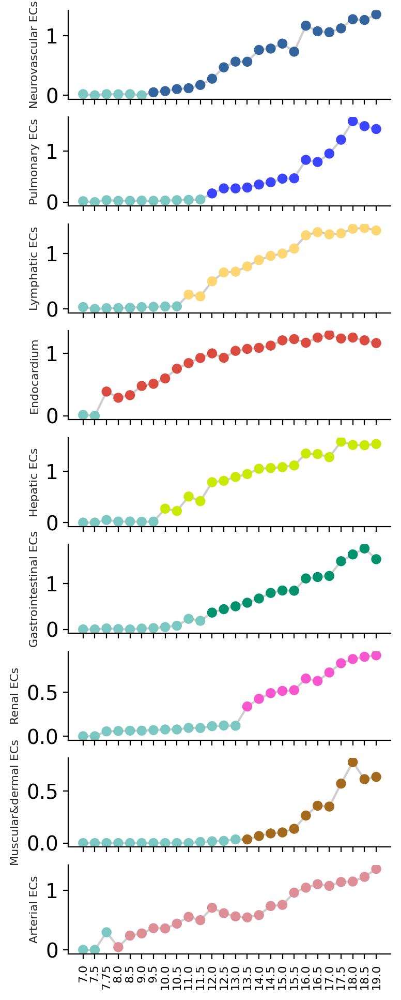

In [120]:
color_dict = dict(zip(adata.obs['label'].cat.categories, adata.uns['label_colors']))
organ_list = adata.obs['label'].cat.categories[1:]
fig,axs = plt.subplots(len(organ_list), 1,figsize = (4,12), sharex=True, sharey=False)
for i in range(len(organ_list)):
    organ = organ_list[i]
    sub_adata = adata[adata.obs['label'] == organ]
    ts = np.unique(sub_adata.obs['embryonic_period'])
    to = adata.obs['embryonic_period'].cat.categories.values[~adata.obs['embryonic_period'].cat.categories.isin(ts)]
    pro_data = adata[(adata.obs['label'] == 'Progenitors') & (adata.obs['embryonic_period'].isin(to))]
    bdata = pro_data.concatenate(sub_adata)
    bdata.obs['embryonic_period'] = pd.Categorical(np.array(bdata.obs['embryonic_period']), adata.obs['embryonic_period'].cat.categories)
    bdata.uns['embryonic_period_colors'] = [color_dict['Progenitors']]*len(to)+[color_dict[organ]]*len(ts)
    mean = bdata.obs.groupby('embryonic_period')['%s_maturity'%organ].median()
    axs[i].scatter(adata.obs['embryonic_period'].cat.categories, mean, color = bdata.uns['embryonic_period_colors'],zorder = 2)
    axs[i].plot(adata.obs['embryonic_period'].cat.categories, mean, color = '#CECECE',linestyle='solid',zorder = 1)
    if i == (len(organ_list)-1):
        axs[i].set_xticklabels(adata.obs['day'].cat.categories, rotation=90, fontsize=8)
    else:
        axs[i].set_xticklabels([])
    axs[i].set_ylabel(organ,fontsize=8)
    axs[i].grid(False)  
    axs[i].spines['top'].set_visible(False)  
    axs[i].spines['right'].set_visible(False)  

### 3.2 UMAP plot

In [121]:
bdata = adata[~adata.obs['embryonic_period'].isin(['E7.0','E7.5'])]
time = np.sort(np.unique(bdata.obs['day']))
bdata.obs['day'] = pd.Categorical(np.array(bdata.obs['day']),time)
bdata.uns['day_colors'] = treesing.create_gradient_color('Spectral_r', len(time), step = 20)

color_dict = dict(zip(bdata.obs['day'].cat.categories.tolist(), bdata.uns['day_colors']))

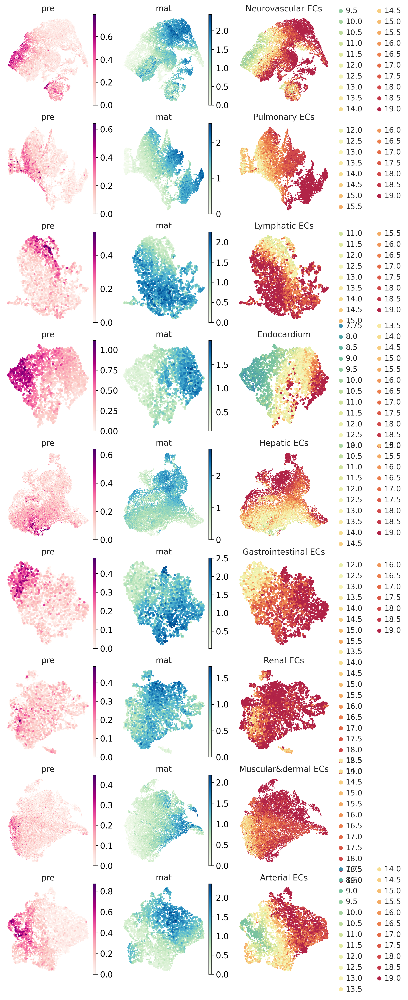

In [122]:
organs = adata.obs['label'].cat.categories[1:]
fig, axs = plt.subplots(len(organs), 3,figsize = (10,30))
for i in range(len(organs)):
    organ = organs[i]
    sub_adata = organ_data[organ]
    umap = sub_adata.obsm['X_umap']
    vmin = umap[:,0][sub_adata.obs['day'] == min(sub_adata.obs['day'])].mean()
    vmax = umap[:,0][sub_adata.obs['day'] == max(sub_adata.obs['day'])].mean()
    if vmin > vmax:
        umap[:,0] = -umap[:,0]
    sub_adata.obsm['X_umap'] = umap
    
    pre_score = sub_adata[:,markers['Undifferentiated']].X.mean(1).A.flatten()
    mat_score = sub_adata[:,markers[organ]].X.mean(1).A.flatten()

    # pre_score = sub_adata.obs['Progenitors_score']
    # mat_score = sub_adata.obs['%s_score'%organ]
    organ_data[organ].obs['pre'] = pre_score
    organ_data[organ].obs['mat'] = mat_score

    sub_adata.obs['pre'] = pre_score
    sub_adata.obs['mat'] = mat_score
    # sub_adata = de.oneStepUmap(sub_adata)
    time = np.sort(np.unique(sub_adata.obs['day']))
    score = []
    for t in time:
        pre_t = pre_score[sub_adata.obs['day'] == t].mean()
        mat_t = mat_score[sub_adata.obs['day'] == t].mean()
        
        score.append([pre_t, mat_t])
    df = pd.DataFrame(np.vstack(score), columns = ['pre','mat'])
    df['time'] = time
    sub_adata.obs['day'] = pd.Categorical(np.array(sub_adata.obs['day']),time)
    # sub_adata.uns['day_colors'] = [color_dict[x] for x in sub_adata.obs['day'].cat.categories.tolist()]  
    
    sub_adata.obs[organ] = sub_adata.obs['day']
    sub_adata.uns['%s_colors'%organ] = sub_adata.uns['day_colors']
    np.random.seed(1)
    o = np.random.choice(np.arange(sub_adata.shape[0]), sub_adata.shape[0], replace=False)
    sc.pl.umap(sub_adata[o],color = ['pre'], ax = axs[i,0], cmap = 'RdPu',show = False,frameon=False)
    sc.pl.umap(sub_adata[o],color = ['mat'], ax = axs[i,1], cmap = 'GnBu',show = False,frameon=False)
    sc.pl.umap(sub_adata[o],color = [organ], ax = axs[i,2], show = False,frameon=False)
plt.savefig('figures/UMAP_maturity_score.pdf')


### 3.3 Heatmap plot

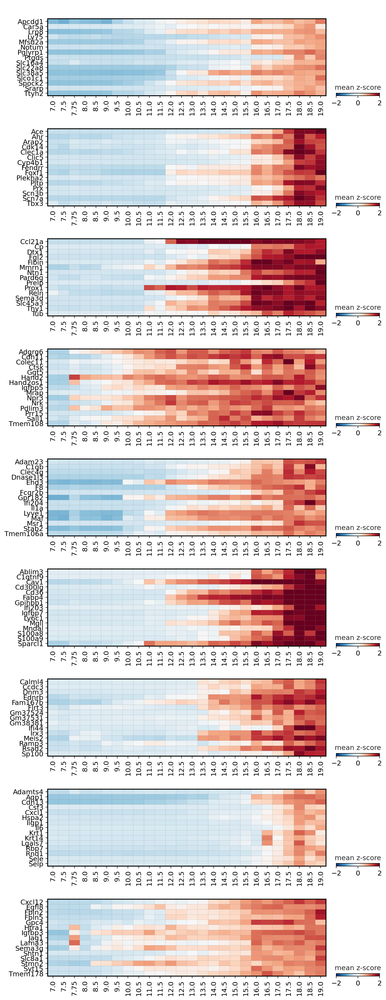

In [123]:
organs = adata.obs['label_2024'].cat.categories[1:]
fig,axs = plt.subplots(len(organs),1,sharex=True, figsize = (10,30))
for i in range(len(organs)):
    organ = organs[i]
    sub_adata = adata[adata.obs['label_2024'] == organ]
    ts = np.unique(sub_adata.obs['embryonic_period'])
    to = adata.obs['embryonic_period'].cat.categories.values[~adata.obs['embryonic_period'].cat.categories.isin(ts)]
    pro_data = adata[(adata.obs['label_2024'] == 'Progenitors') & (adata.obs['embryonic_period'].isin(to))]
    bdata = pro_data.concatenate(sub_adata)
    bdata = bdata[:,list(markers[organ])]
    bdata.layers["scaled"] = sc.pp.scale(bdata, copy=True).X
    sc.pl.matrixplot(
        bdata,
        list(markers[organ]),
        "day",
        dendrogram=False,
        colorbar_title="mean z-score",
        layer="scaled",
        vmin=-2,
        vmax=2,
        swap_axes = True,
        cmap="RdBu_r",
        ax = axs[i],
        show=False
    )
plt.savefig('figures/late_stage_marker_zscore.pdf')

## 4. Predict the maturity of adult cells

In [125]:
brain = sc.read(('endo_dataset_collected/Jeong2022.h5ad'))

In [126]:
brain.obs['Mature'] = brain[:, np.intersect1d(brain.var_names.values,markers['Neurovascular ECs'])].X.mean(1).A.flatten()
brain.obs['Undifferentiated'] = brain[:,np.array(markers['Undifferentiated'])[pd.Series(markers['Undifferentiated']).isin(brain.var_names)]].X.sum(1).A.flatten()/len(markers['Undifferentiated'])

In [127]:
lung = sc.read(('endo_dataset_collected/Hurskainen2021.h5ad'))

In [128]:
np.array(markers['Undifferentiated'])[pd.Series(markers['Undifferentiated']).isin(lung.var_names)]

array(['Bex1', 'Bex2', 'Bex4', 'Epop', 'Hk2', 'Hmga2', 'Lin28a', 'Lin28b',
       'Mdk', 'Mogat2', 'Polr3g', 'Prtg', 'Slc16a3', 'Slc2a3', 'Trim71'],
      dtype='<U7')

In [129]:
# lung.obs['Mature'] = lung[:, markers['Pulmonary ECs']].X.mean(1).A.flatten()
lung.obs['Mature'] = lung[:, np.intersect1d(lung.var_names.values,markers['Pulmonary ECs'])].X.mean(1).A.flatten()
lung.obs['Undifferentiated'] = lung[:,np.array(markers['Undifferentiated'])[pd.Series(markers['Undifferentiated']).isin(lung.var_names)]].X.sum(1).A.flatten()/len(markers['Undifferentiated'])

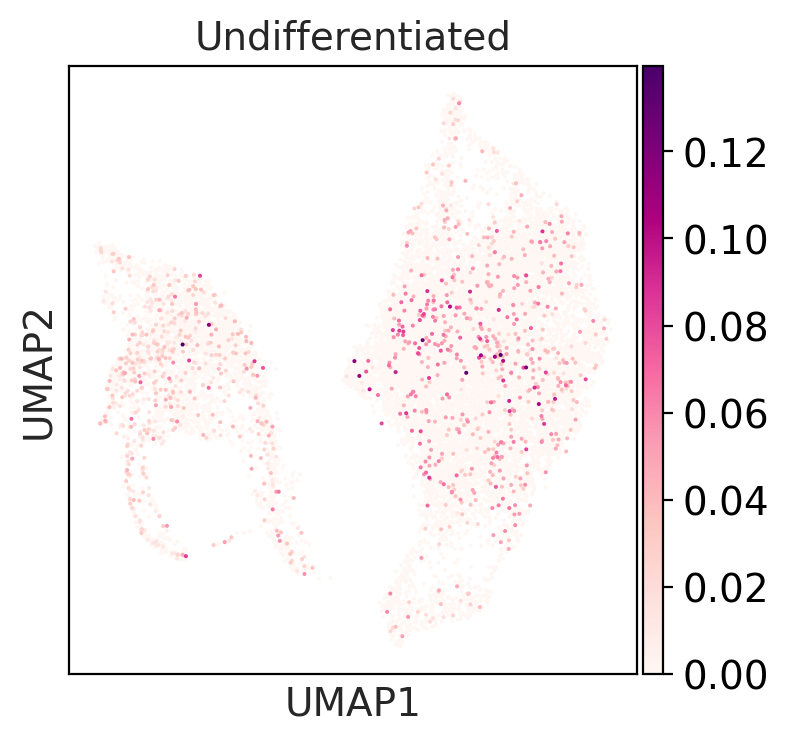

In [130]:
sc.pl.umap(brain, color = 'Undifferentiated',cmap = 'RdPu')

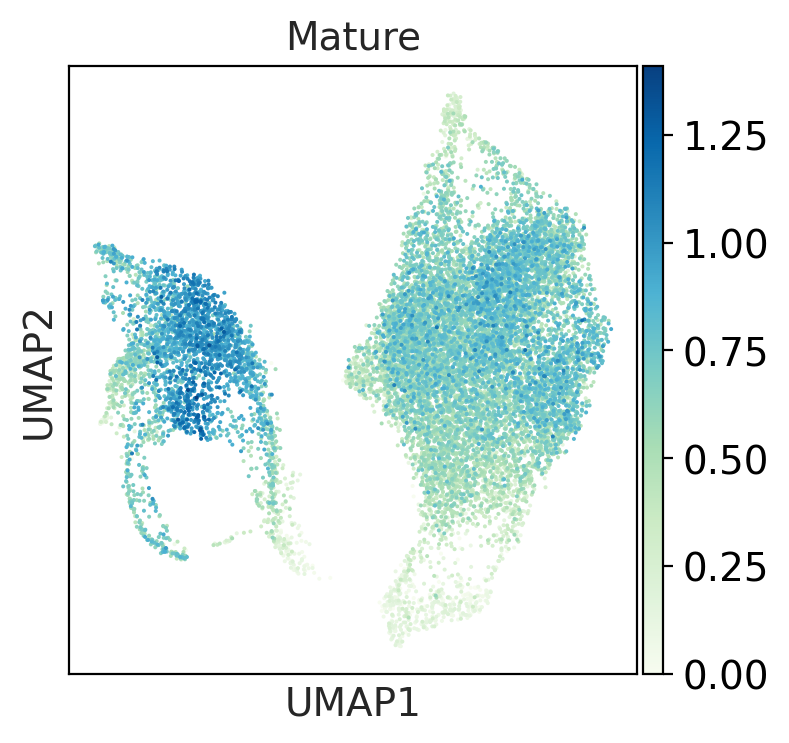

In [131]:
sc.pl.umap(brain, color = 'Mature',cmap = 'GnBu')

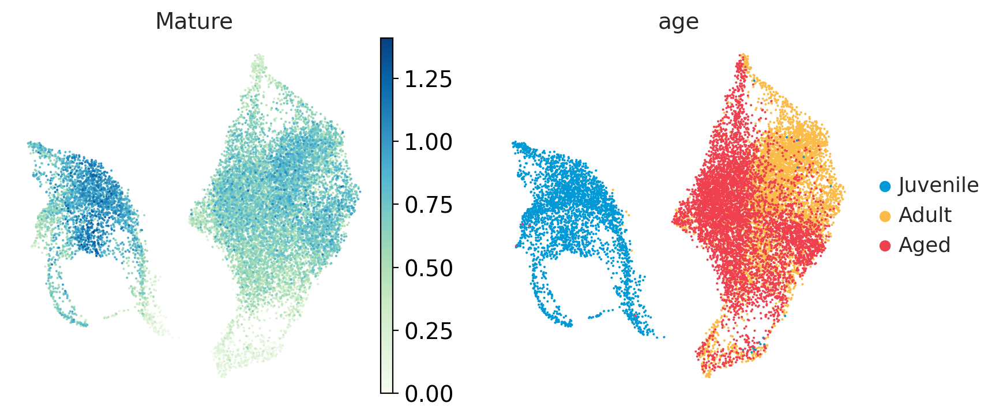

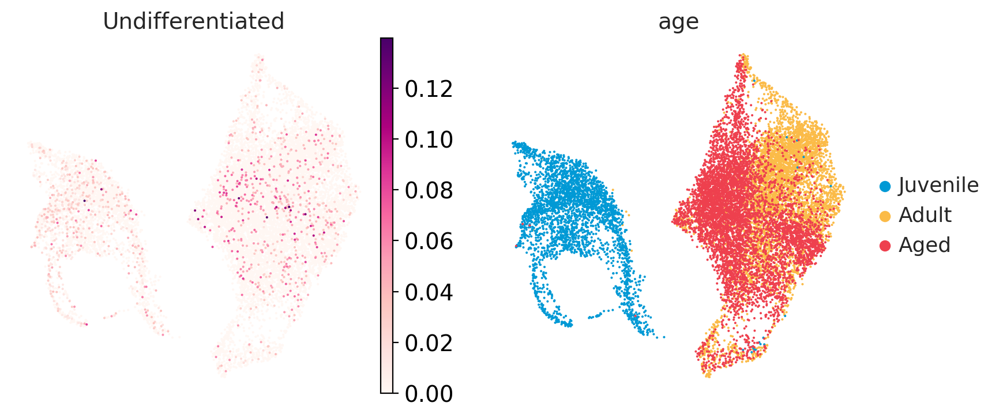

In [132]:
sc.pl.umap(brain, color = ['Mature','age'],cmap = 'GnBu',frameon=False, save='R1Q2_Jeong2022_maturity_score.pdf')
sc.pl.umap(brain, color = ['Undifferentiated','age'],cmap = 'RdPu',frameon=False, save='R1Q2_Jeong2022_progenitor_score.pdf')

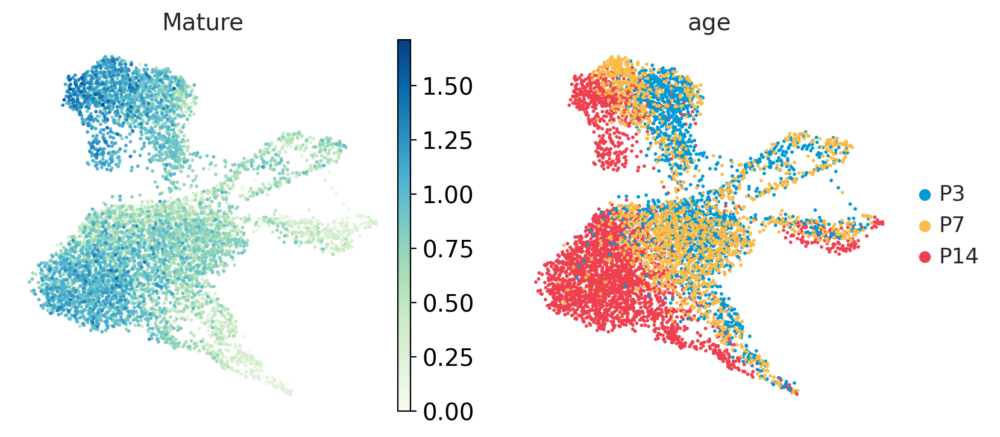

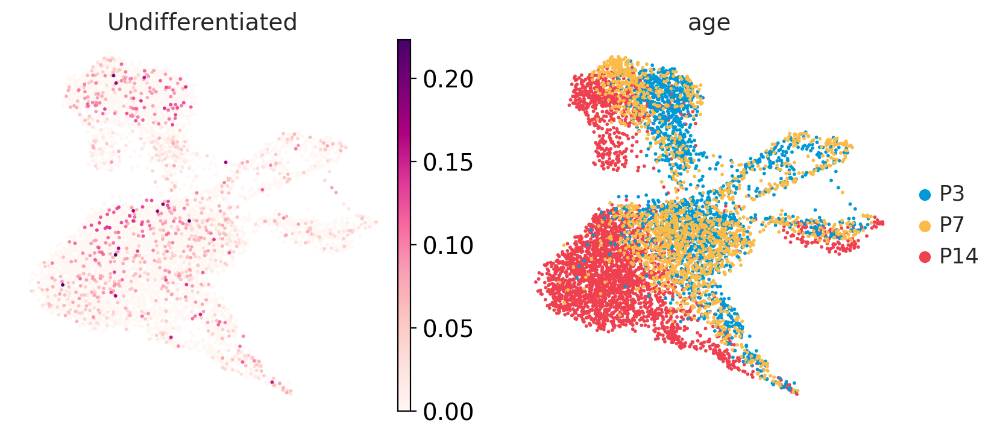

In [134]:
sc.pl.umap(lung, color = ['Mature','age'],cmap = 'GnBu',frameon=False, save='R1Q2_Hurskainen2021_maturity_score.pdf')
sc.pl.umap(lung, color = ['Undifferentiated','age'],cmap = 'RdPu',frameon=False, save='R1Q2_Hurskainen2021_progenitor_score.pdf')

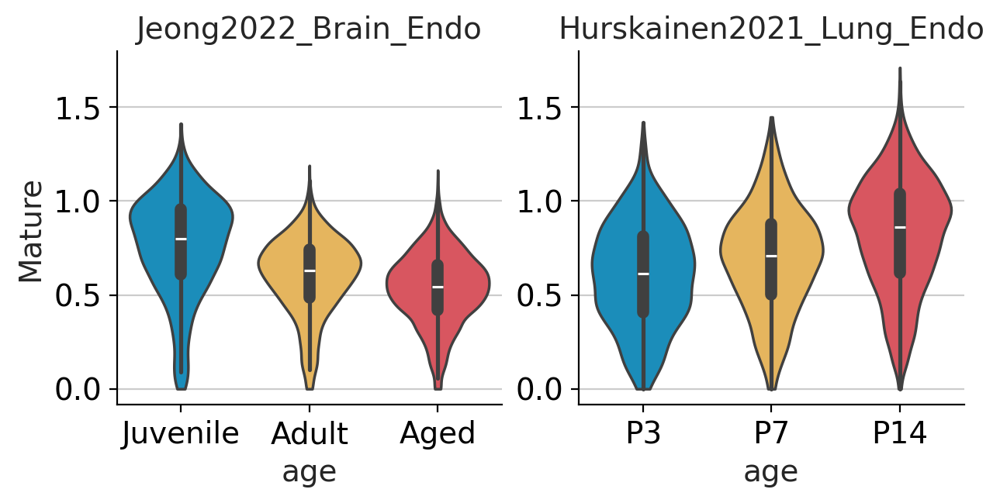

In [135]:
fig,axs = plt.subplots(1, 2,figsize = (7,3),sharey=True)
axs[0].set_title('Jeong2022_Brain_Endo')
sc.pl.violin(
    brain,
    ["Mature"],
    groupby="age",show=False,
    stripplot=False, # remove the internal dots
    inner="box",  ax=axs[0]# adds a boxplot inside violins
)

axs[0].spines['top'].set_visible(False)
axs[0].spines['right'].set_visible(False)
axs[0].tick_params(axis='x', which='both', bottom=True, top=False,left=False, labelleft=True)
axs[0].tick_params(axis='y', which='both', bottom=False, top=False,left=True, labelleft=True)

axs[1].set_title('Hurskainen2021_Lung_Endo')
axs[1].set_ylabel('')
sc.pl.violin(
    lung,
    ["Mature"],
    groupby="age",
    stripplot=False, show=False, # reshow=False,move the internal dots
    inner="box",ax=axs[1]  # adds a boxplot inside violins
)

axs[1].spines['top'].set_visible(False)
axs[1].spines['right'].set_visible(False)
axs[1].tick_params(axis='x', which='both', bottom=True, top=False,left=False, labelleft=True)
axs[1].tick_params(axis='y', which='both', bottom=False, top=False,left=True, labelleft=True)


plt.savefig('figures/R1Q2_violin_predicted_maturity_score.pdf')

In [136]:
from scipy import stats
n = 500
Juvenile = np.random.choice(brain.obs['Mature'].values[brain.obs['age'] == 'Juvenile'], n, replace = False)
Adult = np.random.choice(brain.obs['Mature'].values[brain.obs['age'] == 'Adult'], n, replace = False)
Aged = np.random.choice(brain.obs['Mature'].values[brain.obs['age'] == 'Aged'], n, replace = False)
print('Juvenile vs Adult', stats.ttest_ind(Juvenile, Adult, equal_var=True)[1])
print('Adult vs Aged', stats.ttest_ind(Adult, Aged, equal_var=True)[1])
print('Juvenile vs Aged', stats.ttest_ind(Juvenile, Aged, equal_var=True)[1])

Juvenile vs Adult 1.034508630104872e-19
Adult vs Aged 7.244616889841184e-09
Juvenile vs Aged 1.5694947000835788e-41


In [137]:
from scipy import stats
n = 500
P3 = np.random.choice(lung.obs['Mature'].values[lung.obs['age'] == 'P3'], n, replace = False)
P7 = np.random.choice(lung.obs['Mature'].values[lung.obs['age'] == 'P7'], n, replace = False)
P14 = np.random.choice(lung.obs['Mature'].values[lung.obs['age'] == 'P14'], n, replace = False)
print('P3 vs P7', stats.ttest_ind(P3, P7, equal_var=True)[1])
print('P7 vs P14', stats.ttest_ind(P7, P14, equal_var=True)[1])
print('P3 vs P14', stats.ttest_ind(P3, P14, equal_var=True)[1])

P3 vs P7 3.907505557520354e-07
P7 vs P14 2.678418421536845e-14
P3 vs P14 1.3013065155114706e-33


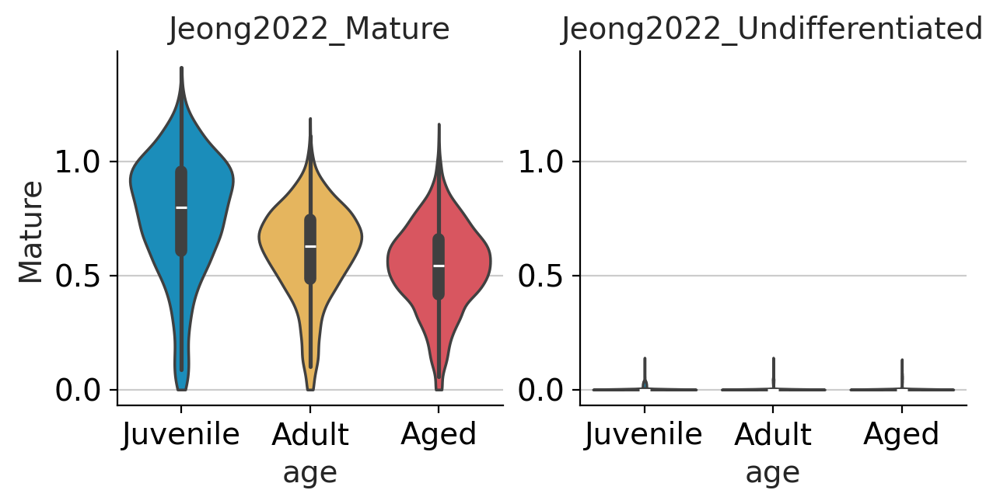

In [138]:
fig,axs = plt.subplots(1, 2,figsize = (7,3),sharey=True)
axs[0].set_title('Jeong2022_Mature')
sc.pl.violin(
    brain,
    ["Mature"],
    groupby="age",show=False,
    stripplot=False, # remove the internal dots
    inner="box",  ax=axs[0]# adds a boxplot inside violins
)

axs[0].spines['top'].set_visible(False)
axs[0].spines['right'].set_visible(False)
axs[0].tick_params(axis='x', which='both', bottom=True, top=False,left=False, labelleft=True)
axs[0].tick_params(axis='y', which='both', bottom=False, top=False,left=True, labelleft=True)


axs[1].set_title('Jeong2022_Undifferentiated')
sc.pl.violin(
    brain,
    ["Undifferentiated"],
    groupby="age",show=False,
    stripplot=False, # remove the internal dots
    inner="box",  ax=axs[1]# adds a boxplot inside violins
)

axs[1].spines['top'].set_visible(False)
axs[1].spines['right'].set_visible(False)
axs[1].tick_params(axis='x', which='both', bottom=True, top=False,left=False, labelleft=True)
axs[1].tick_params(axis='y', which='both', bottom=False, top=False,left=True, labelleft=True)

plt.savefig('figures/R1Q2_violin_predicted_maturity_score_brain.pdf')

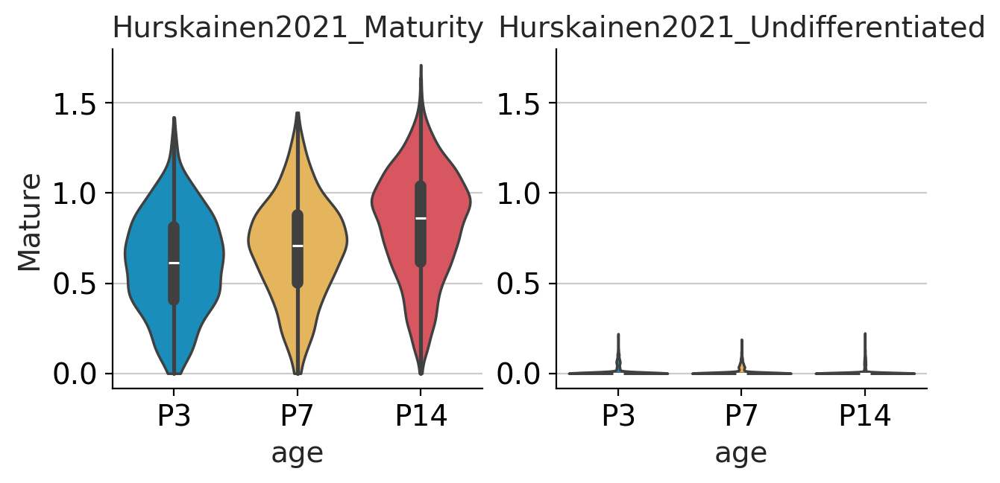

In [139]:
fig,axs = plt.subplots(1, 2,figsize = (7,3),sharey=True)
axs[0].set_title('Hurskainen2021_Maturity')
axs[0].set_ylabel('')
sc.pl.violin(
    lung,
    ["Mature"],
    groupby="age",
    stripplot=False, show=False, # reshow=False,move the internal dots
    inner="box",ax=axs[0]  # adds a boxplot inside violins
)

axs[0].spines['top'].set_visible(False)
axs[0].spines['right'].set_visible(False)
axs[0].tick_params(axis='x', which='both', bottom=True, top=False,left=False, labelleft=True)
axs[0].tick_params(axis='y', which='both', bottom=False, top=False,left=True, labelleft=True)


axs[1].set_title('Hurskainen2021_Undifferentiated')
axs[1].set_ylabel('')
sc.pl.violin(
    lung,
    ["Undifferentiated"],
    groupby="age",
    stripplot=False, show=False, # reshow=False,move the internal dots
    inner="box",ax=axs[1]  # adds a boxplot inside violins
)

axs[1].spines['top'].set_visible(False)
axs[1].spines['right'].set_visible(False)
axs[1].tick_params(axis='x', which='both', bottom=True, top=False,left=False, labelleft=True)
axs[1].tick_params(axis='y', which='both', bottom=False, top=False,left=True, labelleft=True)

plt.savefig('figures/R1Q2_violin_predicted_maturity_score_lung.pdf')

In [140]:
from scipy import stats
n = 500
Juvenile = np.random.choice(brain.obs['Undifferentiated'].values[brain.obs['age'] == 'Juvenile'], n, replace = False)
Adult = np.random.choice(brain.obs['Undifferentiated'].values[brain.obs['age'] == 'Adult'], n, replace = False)
Aged = np.random.choice(brain.obs['Undifferentiated'].values[brain.obs['age'] == 'Aged'], n, replace = False)
print('Juvenile vs Adult', stats.ttest_ind(Juvenile, Adult, equal_var=True)[1])
print('Adult vs Aged', stats.ttest_ind(Adult, Aged, equal_var=True)[1])
print('Juvenile vs Aged', stats.ttest_ind(Juvenile, Aged, equal_var=True)[1])

Juvenile vs Adult 0.005176080275638475
Adult vs Aged 0.15090109871370636
Juvenile vs Aged 0.3209262975879847


In [141]:
from scipy import stats
n = 500
P3 = np.random.choice(lung.obs['Undifferentiated'].values[lung.obs['age'] == 'P3'], n, replace = False)
P7 = np.random.choice(lung.obs['Undifferentiated'].values[lung.obs['age'] == 'P7'], n, replace = False)
P14 = np.random.choice(lung.obs['Undifferentiated'].values[lung.obs['age'] == 'P14'], n, replace = False)
print('P3 vs P7', stats.ttest_ind(P3, P7, equal_var=True)[1])
print('P7 vs P14', stats.ttest_ind(P7, P14, equal_var=True)[1])
print('P3 vs P14', stats.ttest_ind(P3, P14, equal_var=True)[1])

P3 vs P7 0.044954578469581716
P7 vs P14 0.106267450349503
P3 vs P14 0.7621836468210699
